In [1]:
%matplotlib inline
import cv2
import numpy as np
from matplotlib import pyplot as plt
# For 3D visualization
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors
# For preprocessing data
from sklearn.cluster import KMeans
# For floor/ciel function
import math
# Import random to sample points from list
import random
RANDOM_SEED = 169
# Import seaborn for some data visualization
import seaborn as sns
# Import pandas for image selection
import pandas as pd
# Import csv for writing sampled data points to file
import csv

In [2]:
# Function to plot HSV data for image
def hsv_plot(hsv_img):
    # Create 3D visualization plot of HSV space for image
    h, s, v = cv2.split(hsv_img)
    fig = plt.figure()
    axis = fig.add_subplot(1, 1, 1, projection="3d")

    pixel_colors = hsv_img.reshape((np.shape(hsv_img)[0]*np.shape(hsv_img)[1], 3))
    norm = colors.Normalize(vmin=-1.,vmax=1.)
    norm.autoscale(pixel_colors)
    pixel_colors = norm(pixel_colors).tolist()

    axis.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=pixel_colors, marker=".")
    axis.set_xlabel("Hue")
    axis.set_ylabel("Saturation")
    axis.set_zlabel("Value")
    plt.show()

In [3]:
# Function to plot HSV data for image
def hsv_points_plot(hsv_points):
    # Input should be list of ordered triples (h, s, v)
    # Create 3D visualization plot of HSV space for image
    fig = plt.figure()
    axis = fig.add_subplot(1, 1, 1, projection="3d")

    # Initialize color information for plot
    pixel_colors = np.vstack(hsv_points)    
    norm = colors.Normalize(vmin=-1.,vmax=1.)
    norm.autoscale(pixel_colors)
    pixel_colors = norm(pixel_colors).tolist()

    # Convert list of arrays to matrix
    hsv_mat = np.vstack(hsv_points)
    axis.scatter(hsv_mat[:,0], hsv_mat[:,1], hsv_mat[:,2], facecolors=pixel_colors, marker=".")
    axis.set_xlabel("Hue")
    axis.set_ylabel("Saturation")
    axis.set_zlabel("Value")
    plt.show()

In [4]:
# Function to cluster color data for image by pixel location
def img_cluster(img, cluster_format='rgb', n_clusters=2):
    if cluster_format == 'grayscale':
        # Get image dimensions
        height, width = img.shape
    else:
        # Get image dimensions
        height, width, channels = img.shape
    # Get (h,s,v) pixels for image (unless they are black pixels in mask)
    pixels = []
    # Store corresponding pixel locations
    pixel_loc = []
    for i in range(height):
        for j in range(width):
            pixel = img[i,j]
            # Check color_format of image provided by user
            if cluster_format == 'rgb':
                # Check if pixel is essentially not black (part of mask) in RGB 
                if ~(pixel[0] < 25 and pixel[1] < 25 and pixel[2] < 25):
                    pixels.append(pixel)
                    pixel_loc.append([i,j])
            elif cluster_format == 'hsv':
                # Check if pixel is essentially not black (part of mask) in HSV 
                if ~(pixel[0] < 40 and pixel[1] < 40 and pixel[2] == 0):
                    pixels.append(pixel)
                    pixel_loc.append([i,j])
            elif cluster_format == 'grayscale':
                # Check if pixel is essentially not black (part of mask) in grayscale
                if pixel > 8:
                    pixels.append(pixel)
                    pixel_loc.append([i,j])   
            else:
                print("User specified invalid color_format in user defined img_cluster function.\n")
    # Reshape array if grayscale
    if cluster_format == 'grayscale':
        pixels = np.array(pixels).reshape(-1, 1)
        # Split grayscale points into two clusters at median intensity value
        gray_median = np.median(pixels)
        print(gray_median)
        # Initialize list for clusters and their locations on original image
        clusters = []
        cluster_pixel_loc = []
        for i in range(2):
            clusters.append([])
            cluster_pixel_loc.append([])
        for i in range(len(pixels)):
            if pixels[i] <= gray_median:
                clusters[0].append(pixels[i])
                cluster_pixel_loc[0].append(pixel_loc[i])
            else:
                clusters[1].append(pixels[i])
                cluster_pixel_loc[1].append(pixel_loc[i])
    else:
        # Cluster remaining pixels into n_clusters
        kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(pixels)
        # Use labels to return list of clusters
        labels = kmeans.labels_
        # Initialize list for clusters and their locations on original image
        clusters = []
        cluster_pixel_loc = []
        for i in range(n_clusters):
            clusters.append([])
            cluster_pixel_loc.append([])
        for i in range(len(pixels)):
            clusters[labels[i]].append(pixels[i])
            cluster_pixel_loc[labels[i]].append(pixel_loc[i])
    return clusters, cluster_pixel_loc

In [5]:
# Take output from hsv_cluster function and get pixel locations for sampling (Alternative method for sampling)
def sort_and_sample(clusters, cluster_pixel_loc, n_points=100):
    # Initialize list that will contain sampled points pixel locations and v from hsv values
    sampled_points = []
    # Perform sot and sample for each provided cluster
    for i in range(len(clusters)):
        # Convert each cluster into a matrix then extract v from hsv value
        v = np.vstack(clusters[i])[:,2]
        # Sort pixel locations by corresponding v from hsv triple and save in list
        sorted_pixel_loc = [x+[y] for y,x in sorted(zip(v,cluster_pixel_loc[i]))]
        # Sample from sorted list to get n_points and append to sampled_points list
        n_skip = int(float(len(v))/n_points)
        sampled_points.append(sorted_pixel_loc[::n_skip])
        # Ensure list does not exceed n_points
        while len(sampled_points[i]) > n_points:
            del sampled_points[i][-1]
    # Return list of sampled points
    return sampled_points

In [6]:
# Take output from img_cluster function and get darkest and lightest pixel locations and values
def sample_darkest_and_lightest(clusters, cluster_pixel_loc, cluster_format='grayscale', sample_type='extremes', n_points=100):
    # Initialize list that will contain sampled points pixel locations and v from hsv values
    sampled_points = []
    # Perform clustering on elements in each given cluster
    for i in range(len(clusters)):
        # Append empty list to sampled_points list
        sampled_points.append([])
        # If user specified both_ends sampling type, append second empty list to sampled_points list
        if sample_type == 'both_ends' and cluster_format != 'rgb':
            sampled_points.append([])
        # Set cl equal to ith element in clusters
        cl = clusters[i]
        # Set cl_pl equal to ith element in cluster_pixel_loc
        cl_pl = cluster_pixel_loc[i]
        # Check cluster_format type
        if cluster_format == 'rgb':
            # Update sampled_points
            sampled_points = [[],[],[]]
            # Create new triples (x,y,r), (x,y,g), and (x,y,b) where (x,y) are from cl_pl and rgb are from (r,g,b) in cl
            xyrgb = [[],[],[]]
            # Perform clustering for each color (r/g/b)
            for k in range(3):
                for j in range(len(cl)):
                    xyrgb[k].append(np.array([cl_pl[j][0], cl_pl[j][1], cl[j][k]]))
                # Use clustering to group triples (x,y,r/g/b) into n_points clusters then sample 1 point from each cluster with smallest v value
                kmeans = KMeans(n_clusters=n_points, random_state=0).fit(xyrgb[k])
                # Use labels to select one point from each cluster
                labels = kmeans.labels_
                # Initialize list for clusters and their locations on original image
                sub_clusters = []
                for j in range(n_points):
                    sub_clusters.append([])
                for j in range(len(xyrgb[k])):
                    sub_clusters[labels[j]].append(xyrgb[k][j])
                for j in range(len(sub_clusters)):
                    # Convert each cluster into a matrix
                    mat = np.vstack(sub_clusters[j])
                    # Sort each matrix by the 3rd column (v in HSV value)
                    mat = mat[mat[:,2].argsort()]
                    # Sample from sorted list to get only first point in each cluster
                    sampled_points[k].append(mat[0,:].tolist())
        elif cluster_format == 'hsv':
            # Create new triples (x,y,v) where (x,y) are from cl_pl and v is from (h,s,v) in cl
            xyv = []
            for j in range(len(cl)):
                xyv.append(np.array([cl_pl[j][0], cl_pl[j][1], cl[j][2]]))
            # Use clustering to group triples (x,y,v) into n_points clusters then sample 1 point from each cluster with smallest v value
            kmeans = KMeans(n_clusters=n_points, random_state=0).fit(xyv)
            # Use labels to select one point from each cluster
            labels = kmeans.labels_
            # Initialize list for clusters and their locations on original image
            sub_clusters = []
            for j in range(n_points):
                sub_clusters.append([])
            for j in range(len(xyv)):
                sub_clusters[labels[j]].append(xyv[j])
            for j in range(len(sub_clusters)):
                # Convert each cluster into a matrix
                mat = np.vstack(sub_clusters[j])
                # Sort each matrix by the 3rd column (v in HSV value)
                mat = mat[mat[:,2].argsort()]
                # Check cluster format
                if sample_type == 'extremes':
                    if i % 2 == 0:
                        # Sample from sorted list to get only first point in each cluster
                        sampled_points[i].append(mat[0,:].tolist())
                    else:
                        # Sample from sorted list to get only last point in each cluster
                        sampled_points[i].append(mat[-1,:].tolist())
                elif sample_type == 'both_ends':
                    # Sample from sorted list to get only first point in each cluster
                    sampled_points[2*i].append(mat[0,:].tolist())
                    # Sample from sorted list to get only last point in each cluster
                    sampled_points[2*i+1].append(mat[-1,:].tolist())
                else:
                    print("User provided invalid sample_type to user defined function cluster_sort_and_sample.\n")
        elif cluster_format == 'grayscale':
            # Create new triples (x,y,k) where (x,y) are from cl_pl and k is grayscale intensity
            xyk = []
            for j in range(len(cl)):
                xyk.append(np.array([cl_pl[j][0], cl_pl[j][1], cl[j][0]]))
            # Set number of clusters to be 1 for simple version
            n_clusters = 1
            # Use clustering to group triples (x,y,v) into n_points clusters then sample n_points/n_clusters point from each cluster with smallest v value
            kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(xyk)
            # Use labels to select one point from each cluster
            labels = kmeans.labels_
            # Initialize list for clusters and their locations on original image
            sub_clusters = []
            for j in range(n_clusters):
                sub_clusters.append([])
            for j in range(len(xyk)):
                sub_clusters[labels[j]].append(xyk[j])
            for j in range(len(sub_clusters)):
                # Convert each cluster into a matrix
                mat = np.vstack(sub_clusters[j])
                # Sort each matrix by the 3rd column (v in HSV value)
                mat = mat[mat[:,2].argsort()]
                # Check cluster format
                if i % 2 == 0:
                    # Sample from sorted list to get only first point in each cluster
                    for k in range(n_points):
                        sampled_points[i].append(mat[k,:].tolist())
                else:
                    # Sample from sorted list to get only last point in each cluster
                    for k in range(n_points):
                        sampled_points[i].append(mat[-(k+1),:].tolist())
        else:
            print("User provided invalid cluster_format type for user defined function cluster_sort_and_sample.\n")
        # Perform sort and sample for each provided cluster
        
    # Swap order of x and y coordinates in list (currently y,x going to x,y)
    for i in range(len(sampled_points)):
        for point in sampled_points[i]:
            point[0], point[1] = point[1], point[0]
    # Return list of sampled points
    return sampled_points

In [7]:
# Take output from hsv_cluster function and get pixel locations for sampling
def cluster_sort_and_sample(clusters, cluster_pixel_loc, cluster_format='rgb', sample_type='extremes', n_points=100):
    # Initialize list that will contain sampled points pixel locations and v from hsv values
    sampled_points = []
    # Perform clustering on elements in each given cluster
    for i in range(len(clusters)):
        # Append empty list to sampled_points list
        sampled_points.append([])
        # If user specified both_ends sampling type, append second empty list to sampled_points list
        if sample_type == 'both_ends' and cluster_format != 'rgb':
            sampled_points.append([])
        # Set cl equal to ith element in clusters
        cl = clusters[i]
        # Set cl_pl equal to ith element in cluster_pixel_loc
        cl_pl = cluster_pixel_loc[i]
        # Check cluster_format type
        if cluster_format == 'rgb':
            # Update sampled_points
            sampled_points = [[],[],[]]
            # Create new triples (x,y,r), (x,y,g), and (x,y,b) where (x,y) are from cl_pl and rgb are from (r,g,b) in cl
            xyrgb = [[],[],[]]
            # Perform clustering for each color (r/g/b)
            for k in range(3):
                for j in range(len(cl)):
                    xyrgb[k].append(np.array([cl_pl[j][0], cl_pl[j][1], cl[j][k]]))
                # Use clustering to group triples (x,y,r/g/b) into n_points clusters then sample 1 point from each cluster with smallest v value
                kmeans = KMeans(n_clusters=n_points, random_state=0).fit(xyrgb[k])
                # Use labels to select one point from each cluster
                labels = kmeans.labels_
                # Initialize list for clusters and their locations on original image
                sub_clusters = []
                for j in range(n_points):
                    sub_clusters.append([])
                for j in range(len(xyrgb[k])):
                    sub_clusters[labels[j]].append(xyrgb[k][j])
                for j in range(len(sub_clusters)):
                    # Convert each cluster into a matrix
                    mat = np.vstack(sub_clusters[j])
                    # Sort each matrix by the 3rd column (v in HSV value)
                    mat = mat[mat[:,2].argsort()]
                    # Sample from sorted list to get only first point in each cluster
                    sampled_points[k].append(mat[0,:].tolist())
        elif cluster_format == 'hsv':
            # Create new triples (x,y,v) where (x,y) are from cl_pl and v is from (h,s,v) in cl
            xyv = []
            for j in range(len(cl)):
                xyv.append(np.array([cl_pl[j][0], cl_pl[j][1], cl[j][2]]))
            # Use clustering to group triples (x,y,v) into n_points clusters then sample 1 point from each cluster with smallest v value
            kmeans = KMeans(n_clusters=n_points, random_state=0).fit(xyv)
            # Use labels to select one point from each cluster
            labels = kmeans.labels_
            # Initialize list for clusters and their locations on original image
            sub_clusters = []
            for j in range(n_points):
                sub_clusters.append([])
            for j in range(len(xyv)):
                sub_clusters[labels[j]].append(xyv[j])
            for j in range(len(sub_clusters)):
                # Convert each cluster into a matrix
                mat = np.vstack(sub_clusters[j])
                # Sort each matrix by the 3rd column (v in HSV value)
                mat = mat[mat[:,2].argsort()]
                # Check cluster format
                if sample_type == 'extremes':
                    if i % 2 == 0:
                        # Sample from sorted list to get only first point in each cluster
                        sampled_points[i].append(mat[0,:].tolist())
                    else:
                        # Sample from sorted list to get only last point in each cluster
                        sampled_points[i].append(mat[-1,:].tolist())
                elif sample_type == 'both_ends':
                    # Sample from sorted list to get only first point in each cluster
                    sampled_points[2*i].append(mat[0,:].tolist())
                    # Sample from sorted list to get only last point in each cluster
                    sampled_points[2*i+1].append(mat[-1,:].tolist())
                else:
                    print("User provided invalid sample_type to user defined function cluster_sort_and_sample.\n")
        elif cluster_format == 'grayscale':
            # Create new triples (x,y,k) where (x,y) are from cl_pl and k is grayscale intensity
            xyk = []
            for j in range(len(cl)):
                xyk.append(np.array([cl_pl[j][0], cl_pl[j][1], cl[j][0]]))
            # Use clustering to group triples (x,y,v) into n_points clusters then sample 1 point from each cluster with smallest v value
            kmeans = KMeans(n_clusters=n_points, random_state=0).fit(xyk)
            # Use labels to select one point from each cluster
            labels = kmeans.labels_
            # Initialize list for clusters and their locations on original image
            sub_clusters = []
            for j in range(n_points):
                sub_clusters.append([])
            for j in range(len(xyk)):
                sub_clusters[labels[j]].append(xyk[j])
            for j in range(len(sub_clusters)):
                # Convert each cluster into a matrix
                mat = np.vstack(sub_clusters[j])
                # Sort each matrix by the 3rd column (v in HSV value)
                mat = mat[mat[:,2].argsort()]
                # Check cluster format
                if i % 2 == 0:
                    # Sample from sorted list to get only first point in each cluster
                    sampled_points[i].append(mat[0,:].tolist())
                else:
                    # Sample from sorted list to get only last point in each cluster
                    sampled_points[i].append(mat[-1,:].tolist())
        else:
            print("User provided invalid cluster_format type for user defined function cluster_sort_and_sample.\n")
        # Perform sort and sample for each provided cluster
        
    # Swap order of x and y coordinates in list (currently y,x going to x,y)
    for i in range(len(sampled_points)):
        for point in sampled_points[i]:
            point[0], point[1] = point[1], point[0]
    # Return list of sampled points
    return sampled_points

In [8]:
# Function to plot sampled points with projection onto x-y plane
def sampled_points_plot(sampled_points, 
                        sampled_boundary=None, 
                        img_file=None, 
                        cluster_format='rgb', 
                        resize_factor=1, 
                        fname_prefix=None,
                        show_plot=True
                       ):
    # Input should be list of ordered triples (x, y, v) where
    # x = x coordinate of pixel
    # y = y coordinate of pixel
    # v = value from hsv image data (essentially intensity)
    # Create 3D visualization plot of XYV space for image
    figsize=(24,24)
    fig = plt.figure(figsize=figsize)
    axis = fig.add_subplot(1, 1, 1, projection="3d")
    # Initialize zmax to 0
    zmax = 0
    
    # Prepare image to plot if provided
    if img_file is not None:
        # Read image
        img = cv2.imread(img_file)
        # Convert BGR to RGB image format
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # Resize image
        if resize_factor < 1 and resize_factor > 0:
            width = int(img.shape[1] * resize_factor)
            height = int(img.shape[0] * resize_factor)
            dim = (width, height)
            # resize image
            img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA) 
        # create a vertex mesh the size of the image in img_file
        x_dim = np.shape(img)[1]
        y_dim = np.shape(img)[0]
        X, Y = np.meshgrid(x_dim * np.linspace(0,1,x_dim), y_dim * np.linspace(0,1,y_dim))
        Z = 0 * np.ones(X.shape)
        # Check if file is jpg or png
        if '.jpg' in img_file:
            #axis.plot_surface(X, Y, Z, rstride=1, cstride=1, facecolors=plt.imread(img_file)/255., shade=False)
            axis.plot_surface(X, Y, Z, rstride=1, cstride=1, facecolors=img/255., shade=False)
        elif '.png' in img_file:
            axis.plot_surface(X, Y, Z, rstride=1, cstride=1, facecolors=plt.imread(img_file), shade=False)   
        axis.set_xlim3d(0,x_dim)
        axis.set_ylim3d(0,y_dim)
        
    # Plot boundary contour if provided
    if sampled_boundary is not None:
        # Scatter plot of boundary onto xy-plane
        axis.plot(sampled_boundary[:,0], sampled_boundary[:,1], 'wx', zdir='z', zs=0)
        # If grayscale cluster format generate scatter plot of points in 3d space
        if cluster_format == 'grayscale':
            # Scatter plot of points in 3d space
            axis.scatter(sampled_boundary[:,0], sampled_boundary[:,1], sampled_boundary[:,2], s=20, marker='.', color='w', linewidths=3)
            # Get maximum value in z direction
            zmax = max(zmax, max(sampled_boundary[:,2]))

    # Check color format specified by user
    if cluster_format == 'rgb':
        # Set array of colors used for different plots
        c = ['r', 'g', 'b']
        # Set array of markers used for different plots
        m = ['r1', 'g2', 'b3']
        # Loop through lists of sampled points and generate plots for each
        for i in range(len(sampled_points)):
            # Convert list of arrays to matrix
            sampled_mat = np.vstack(sampled_points[i])
            # Scatter plot of points in 3d space
            axis.scatter(sampled_mat[:,0], sampled_mat[:,1], sampled_mat[:,2], s=20, marker='.', color=c[i], linewidths=3)
            # Projection of scatter plot onto xy-plane
            axis.plot(sampled_mat[:,0], sampled_mat[:,1], m[i], zdir='z', zs=0)
            # Get maximum value in z direction
            zmax = max(zmax, max(sampled_mat[:,2]))
    elif cluster_format == 'hsv':
        # Set array of colors used for different plots
        c = ['b', 'k', 'y', 'g']
        # Set array of markers used for different plots
        m = ['b1', 'k2', 'y3', 'g4']
        # Loop through lists of sampled points and generate plots for each
        for i in range(len(sampled_points)):
            # Convert list of arrays to matrix
            sampled_mat = np.vstack(sampled_points[i])
            # Scatter plot of points in 3d space
            axis.scatter(sampled_mat[:,0], sampled_mat[:,1], sampled_mat[:,2], s=20, marker='.', color=c[i], linewidths=3)
            # Projection of scatter plot onto xy-plane
            axis.plot(sampled_mat[:,0], sampled_mat[:,1], m[i], zdir='z', zs=0)
            # Get maximum value in z direction
            zmax = max(zmax, max(sampled_mat[:,2]))
    elif cluster_format == 'grayscale':
        # Set array of colors used for different plots
        c = ['k', 'b']
        # Set array of markers used for different plots
        m = ['k1', 'b2']
        # Loop through lists of sampled points and generate plots for each
        for i in range(len(sampled_points)):
            # Convert list of arrays to matrix
            sampled_mat = np.vstack(sampled_points[i])
            # Scatter plot of points in 3d space
            axis.scatter(sampled_mat[:,0], sampled_mat[:,1], sampled_mat[:,2], s=20, marker='.', color=c[i], linewidths=3)
            # Projection of scatter plot onto xy-plane
            axis.plot(sampled_mat[:,0], sampled_mat[:,1], m[i], zdir='z', zs=0)
            # Get maximum value in z direction
            zmax = max(zmax, max(sampled_mat[:,2]))
        
    # Label axes
    axis.set_xlabel("X")
    axis.set_ylabel("Y")
    axis.set_zlabel("Value")
    # Make axes see through
    axis.xaxis.pane.set_facecolor(('#ffa5a5'))
    axis.yaxis.pane.set_facecolor(('#ff8989'))
    axis.zaxis.pane.fill = False
    # Set limit for z axis
    axis.set_zlim3d(0,zmax)
    
    # Check if the plot should be saved as a .png file
    if fname_prefix is not None:
        # Save figure without extra whitespace around plot
        plt.savefig(fname_prefix + '.png', bbox_inches='tight')
    # Show the plot
    if show_plot == True:
        plt.show()
    else:
        plt.close()

In [9]:
# Function to sample points along longest boundary of skin cancer in image
def get_and_sample_boundary(img_thresh, n_points=100):
    # Get contours of thresholded image
    contours, hierarchy = cv2.findContours(img_thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    # Extract contour with maximum length from list of all contours
    max_contour = max(contours,key=len)
    # Converts max_contour into array of ordered pairs (converts from 3D array with one dim = 1 to 2D array)
    squeeze_max_contour = max_contour.squeeze()
    # Sample from the contour points to get simplified contour with specified number of points
    n_skip = int(float(squeeze_max_contour.shape[0])/n_points)
    sampled_boundary = squeeze_max_contour[::n_skip]
    print (sampled_boundary.shape)
    # Return the sampled boundary
    return sampled_boundary

In [10]:
# Pipeline function that takes path to file, gets all points, and creates plot
def process_image(img_file, 
                  cluster_format='rgb', 
                  resize_factor=1, 
                  generate_plot=True, 
                  output_fname_prefix=None,
                  show_plot=True,
                  sample_type='cluster'
                 ):
    # Read image data from file (defaults to BGR format)
    bgr_img = cv2.imread(img_file)
    
    # Resize image
    if resize_factor <= 1 and resize_factor > 0:
        width = int(bgr_img.shape[1] * resize_factor)
        height = int(bgr_img.shape[0] * resize_factor)
        dim = (width, height)
        # resize image
        bgr_img = cv2.resize(bgr_img, dim, interpolation = cv2.INTER_AREA) 
    
    # ---- Create various forms of image data used in preprocessing and plotting ---- #
    # Create RGB version of image
    rgb_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)
    # Create hsv version of image
    hsv_img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HSV)
    # Create grayscale version of image
    gray_img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2GRAY)
    
    # ---- Threshold image data to isolate skin cancer part of image ---- #
    # thresh will be mask that, when applied to original image, will isolate skin cancer part
    ret, thresh = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)    
    # Apply thresholded image as mask to RGB image to get residual image
    residual = cv2.bitwise_and(rgb_img, rgb_img, mask=thresh)
    
    # ---- Cluster and sample points from interior of skin cancer in image ---- #
    if cluster_format == 'rgb':
        # Cluser points on image using RGB residual image
        clusters, cluster_pixel_loc = img_cluster(residual, cluster_format=cluster_format, n_clusters=1)
    elif cluster_format == 'hsv':
        # Convert residual to HSV
        hsv_residual = cv2.cvtColor(residual, cv2.COLOR_RGB2HSV)
        # Cluser points on image using HSV residual image
        clusters, cluster_pixel_loc = img_cluster(hsv_residual, cluster_format=cluster_format)
    elif cluster_format == 'grayscale':
        # Convert residual to grayscale
        grayscale_residual = cv2.cvtColor(residual, cv2.COLOR_RGB2GRAY)
        # Cluser points on image using grayscale residual image
        clusters, cluster_pixel_loc = img_cluster(grayscale_residual, cluster_format=cluster_format)
    
    # ---- Sample points from residual image cluster information ---- #
    if sample_type == 'simple':
        sampled_points = sample_darkest_and_lightest(clusters, cluster_pixel_loc, cluster_format=cluster_format)
    elif sample_type == 'cluster':
        sampled_points = cluster_sort_and_sample(clusters, cluster_pixel_loc, cluster_format=cluster_format)
    
    # ---- Sample points from boundary of skin cancer in image ---- #
    sampled_boundary = get_and_sample_boundary(thresh)
    # Subsample 100 points from sampled_bounday in case it is too many points
    random.seed(RANDOM_SEED)
    subsampled_boundary = np.array(random.sample(sampled_boundary, 100))
    # If grayscale get value at pixel location
    if cluster_format == 'grayscale':
        # Loop over all points on boundary and get pixel value
        pixels = []
        for indices in subsampled_boundary:
            pixels.append(gray_img[indices[1],indices[0]])
        # Append list as column in subsampled boundary matrix
        subsampled_boundary = np.hstack((subsampled_boundary, np.array(pixels, ndmin=2).T))
    # Check if user specified file to save data to
    if output_fname_prefix is not None:
        # Save boundary and sampled points to csv files
        if cluster_format == 'grayscale':
            # Save boundary data to file
            with open(output_fname_prefix + '_gray_boundary.csv', 'wb') as myfile:
                wr = csv.writer(myfile)
                wr.writerows(subsampled_boundary.tolist())
            # Save darker data points to file
            with open(output_fname_prefix + '_gray_dark.csv', 'wb') as myfile:
                wr = csv.writer(myfile)
                wr.writerows(sampled_points[0])
            # Save lighter data points to file
            with open(output_fname_prefix + '_gray_light.csv', 'wb') as myfile:
                wr = csv.writer(myfile)
                wr.writerows(sampled_points[1])
    
    # ---- Plot RGB image with 3D points with triples (x, y, v) (x,y = location; v = value in grayscale, RBG, or HSV) ---- #
    if generate_plot == True:
        sampled_points_plot(sampled_points, 
                            sampled_boundary=subsampled_boundary, 
                            img_file=img_file, 
                            cluster_format=cluster_format, 
                            resize_factor=resize_factor, 
                            fname_prefix=output_fname_prefix, 
                            show_plot=show_plot)
    
    # ---- Return sampled_boundary and sampled_points ---- #
    if cluster_format == 'rgb':
        return [subsampled_boundary.tolist(), sampled_points[0], sampled_points[1], sampled_points[2]]
    elif cluster_format == 'hsv':
        return [subsampled_boundary.tolist(), sampled_points[1], sampled_points[0]]
    elif cluster_format == 'grayscale':
        return [subsampled_boundary.tolist(), sampled_points[0], sampled_points[1]]

# Sample Points from Subset of Full Training Set

In [11]:
# Create dataframe from csv data
df = pd.read_csv("HAM10000_metadata.csv")

# Create image_id_number by stripping number from image_id feature
df['image_id_number'] = df['image_id'].apply(lambda x: int(x[5:]))

# Create dataset with only ham10000_images_part_2 data
df2 = df[df['image_id_number'] >= 29306]

# Determine percentage of each element in the dx feature
# Note the corresponding keys for each type in dx
# akiec: Actinic keratoses and intraepithelial carcinoma / Bowen's disease 
# bcc..: basal cell carcinoma 
# bkl..: benign keratosis-like lesions (solar lentigines / seborrheic keratoses and lichen-planus like keratoses)
# df...: dermatofibroma 
# mel..: melanoma 
# nv...: melanocytic nevi
# vasc.: vascular lesions (angiomas, angiokeratomas, pyogenic granulomas and hemorrhage)
df2['dx'].value_counts(normalize=True) * 100

nv       65.284148
mel      13.519442
bkl      10.667996
bcc       4.945165
akiec     2.871386
vasc      1.535394
df        1.176471
Name: dx, dtype: float64

In [12]:
# Remove images from certain locations on the body
df2 = df2[df2['localization'] != 'scalp']
df2 = df2[df2['localization'] != 'ear']
df2 = df2[df2['localization'] != 'unknown']
df2 = df2[df2['localization'] != 'genital']

In [13]:
# Create lists of all image filenames from available images
nv_list = list(df2[df2['dx']=='nv']['image_id'])
mel_list = list(df2[df2['dx']=='mel']['image_id'])
bkl_list = list(df2[df2['dx']=='bkl']['image_id'])
bcc_list = list(df2[df2['dx']=='bcc']['image_id'])
akiec_list = list(df2[df2['dx']=='akiec']['image_id'])
vasc_list = list(df2[df2['dx']=='vasc']['image_id'])
df_list = list(df2[df2['dx']=='df']['image_id'])

In [14]:
# Create index lists indicating which plots and sampled points to keep
# Following indices have some points outside boundary: 23, 30, 37, 48, 57, 62, 63, 70, 85 
mel_indices = [6, 7, 10, 11, 15, 18, 19, 22, 24, 26, 28, 34, 38, 43, 44, 47, 50, 52, 66, 68, 
               71, 78, 84, 87, 89, 90, 92, 93, 94, 99, 100,
               23, 30, 37, 48, 57, 62, 63, 70, 85] 
# Following indices have some points outside boundary: 10, 16, 17, 29, 33, 56, 67, 93
bkl_indices = [1, 7, 26, 44, 45, 46, 54, 57, 69, 70, 71, 74, 77, 78, 88, 89, 90, 98, 100, 105, 
               109, 117, 118, 120, 128, 129, 130, 131, 132, 133, 134, 135, 136, 
               10, 16, 17, 29, 33, 56, 67, 93]
# Following indices have some points outside boundary: 19, 58, 67, 75, 84, 87
nv_indices = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 14, 15, 16, 17, 18, 20, 22, 25, 26, 28, 32, 33, 
              35, 40, 41, 50, 53, 57, 59, 60, 61, 62, 65, 66, 68, 69, 70, 71, 72, 77, 78, 79, 
              80, 81, 82, 83, 85, 88, 90, 91, 93, 96, 98,
              19, 58, 67, 75, 84, 87]

In [24]:
# Initialize parameters for preprocessing data
imgname_prefix = "ham10000_images_part_2/"
cluster_format='grayscale'
resize_factor=0.15
fname_prefix='Play-Sampled-Data-and-Plots/'
cancer_types = ['nv', 'mel', 'bkl']
cancer_image_lists = [nv_list, mel_list, bkl_list]
cancer_index_lists = [nv_indices, mel_indices, bkl_indices]

# Simple Sampling Method

In [16]:
# SIMPLE SAMPLING METHOD
# Loop over all selected images, save plots and sampled data points using simple sampling method
for i in range(len(cancer_types)):
    cancer = cancer_types[i]
    cancer_images = cancer_image_lists[i]
    index_list = cancer_index_lists[i]
    for j in range(len(index_list)):
        # Set output filename prefix
        output_fname_prefix = fname_prefix + cancer + str(j)
        # Sample points for each image noted above, save points in .csv file, and save plot as .png
        sampled_points = process_image(imgname_prefix + cancer_images[index_list[j]] + ".jpg", 
                                       cluster_format=cluster_format, 
                                       resize_factor=resize_factor,
                                       output_fname_prefix=output_fname_prefix,
                                       show_plot=False,
                                       sample_type='simple'
                                      )

136.0
(113, 2)
130.0
(116, 2)
45.0
(127, 2)
48.0
(179, 2)
80.0
(104, 2)
86.0
(112, 2)
98.0
(125, 2)
79.0
(144, 2)
108.0
(114, 2)
112.0
(123, 2)
93.0
(114, 2)
52.0
(132, 2)
92.0
(185, 2)
98.0
(149, 2)
85.0
(189, 2)
95.0
(129, 2)
82.0
(145, 2)
130.0
(123, 2)
93.0
(127, 2)
131.0
(106, 2)
100.0
(103, 2)
93.0
(141, 2)
90.0
(174, 2)
89.0
(107, 2)
109.0
(103, 2)
114.0
(114, 2)
94.0
(120, 2)
77.0
(104, 2)
73.0
(107, 2)
109.0
(115, 2)
97.0
(148, 2)
106.0
(103, 2)
111.0
(105, 2)
134.0
(109, 2)
144.0
(114, 2)
119.0
(143, 2)
124.0
(126, 2)
108.0
(147, 2)
79.0
(129, 2)
95.0
(168, 2)
101.0
(133, 2)


# Complex Sampling Method

In [ ]:
# COMPLEX SAMPLING METHOD
# Loop over all selected images, save plots and sampled data points using more complex method
for i in range(len(cancer_types)):
    cancer = cancer_types[i]
    cancer_images = cancer_image_lists[i]
    index_list = cancer_index_lists[i]
    for j in range(len(index_list)):
        # Set output filename prefix
        output_fname_prefix = fname_prefix + cancer + str(j)
        # Sample points for each image noted above, save points in .csv file, and save plot as .png
        sampled_points = process_image(imgname_prefix + cancer_images[index_list[j]] + ".jpg", 
                                       cluster_format=cluster_format, 
                                       resize_factor=resize_factor,
                                       output_fname_prefix=output_fname_prefix,
                                       show_plot=False
                                      )

144.0
(148, 2)
108.0
(136, 2)
86.0
(106, 2)
108.0
(108, 2)
63.0
(199, 2)
83.0
(103, 2)
121.0
(127, 2)
86.0
(110, 2)
62.0
(135, 2)
68.0
(119, 2)
93.0
(138, 2)
89.0
(113, 2)
121.0
(146, 2)
149.0
(171, 2)
73.0
(128, 2)
109.0
(114, 2)
110.0
(173, 2)
63.0
(127, 2)
81.0
(100, 2)
99.0
(182, 2)
99.0
(101, 2)
91.0
(116, 2)
105.0
(110, 2)
101.0
(189, 2)
134.0
(111, 2)
142.0
(116, 2)
83.0
(138, 2)
105.0
(118, 2)
85.0
(157, 2)
61.0
(108, 2)
102.0
(104, 2)
104.0
(138, 2)
137.0
(105, 2)
135.0
(147, 2)
63.0
(107, 2)
68.0
(124, 2)
76.0
(137, 2)
118.0
(123, 2)
131.0
(159, 2)
107.0
(133, 2)
99.0
(107, 2)
100.0
(111, 2)
133.0
(118, 2)
66.0
(123, 2)
99.0
(119, 2)
119.0
(110, 2)
92.0
(108, 2)
129.0
(130, 2)
95.0
(118, 2)
85.0
(110, 2)
109.0
(115, 2)
107.0
(113, 2)
117.0
(120, 2)
110.0
(101, 2)
141.0
(111, 2)
78.0
(125, 2)
118.0
(174, 2)
125.0
(111, 2)
95.0
(103, 2)
103.0
(174, 2)
137.0
(124, 2)
122.0
(118, 2)
140.0
(107, 2)
100.0
(182, 2)
113.0
(148, 2)
102.0
(113, 2)
105.0
(132, 2)
52.0
(150, 2)
76.0
(106

# Old Code Used as Part of Testing Functions

89.0
(183, 2)


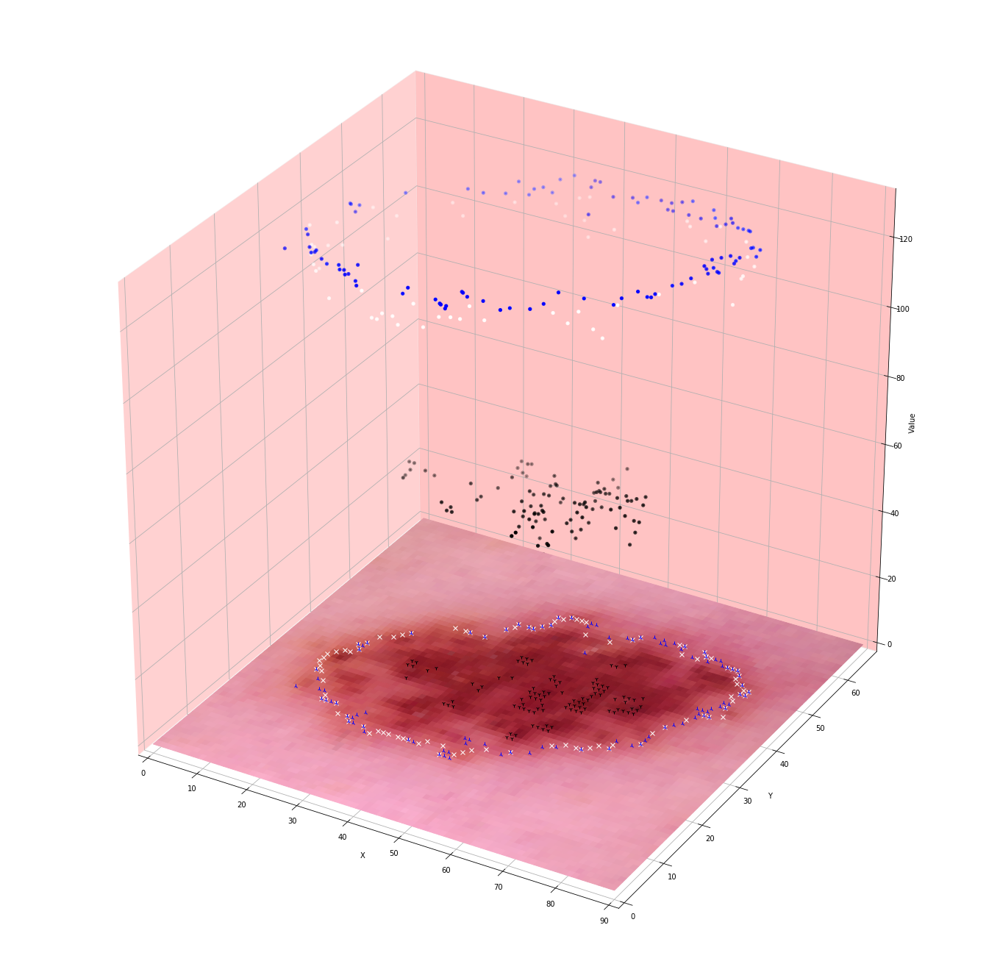

In [38]:
j += 1
sampled_points = process_image(imgname_prefix + cancer_image_lists[0][cancer_index_lists[0][j]] + ".jpg", 
                               cluster_format=cluster_format, 
                               resize_factor=resize_factor,
                               output_fname_prefix=fname_prefix + cancer_types[0] + str(j),
                               show_plot=True,
                               sample_type='simple'
                              )

(139, 2)


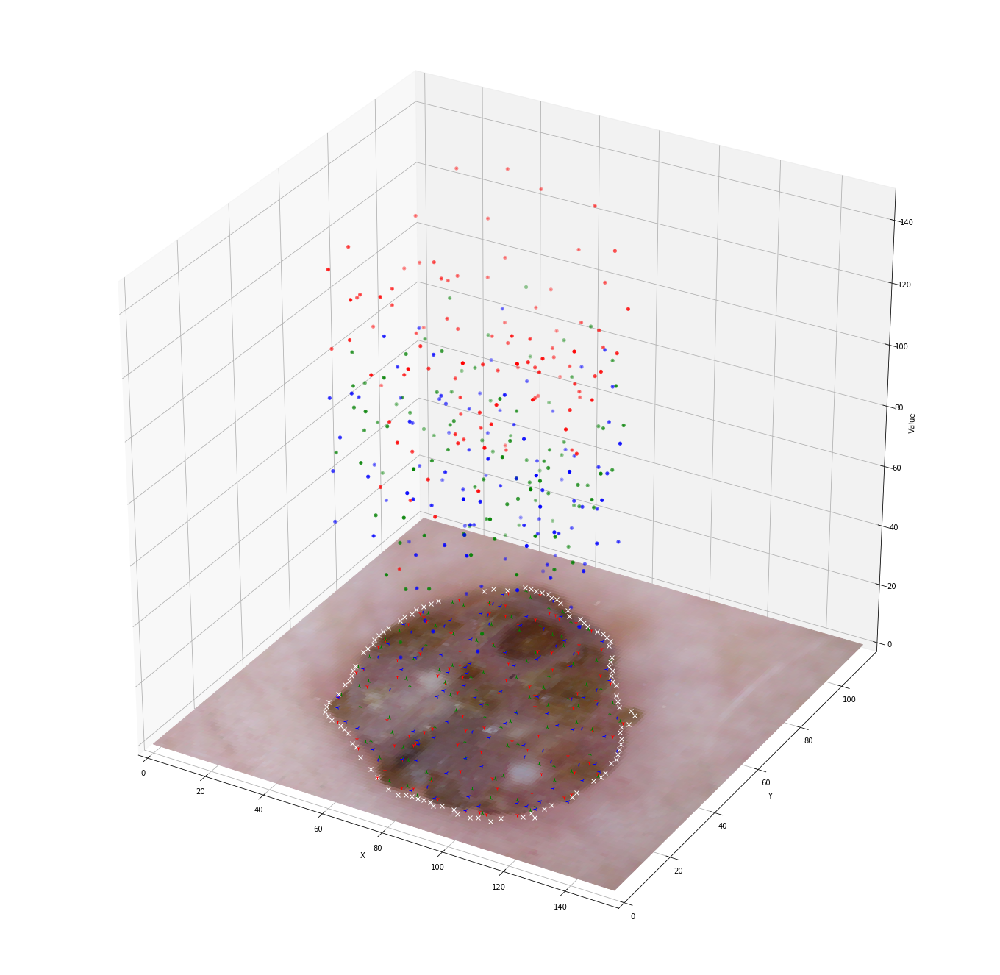

In [67]:
sampled_points = process_image("Image-Data/other_cancer.png", cluster_format='rgb')

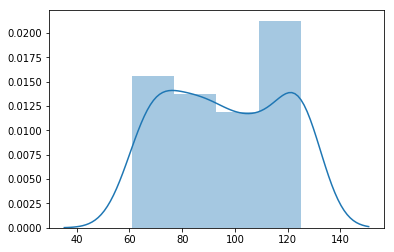

In [53]:
parr = np.array(sampled_points[1])
sns.distplot(parr[:,2])

(122, 2)


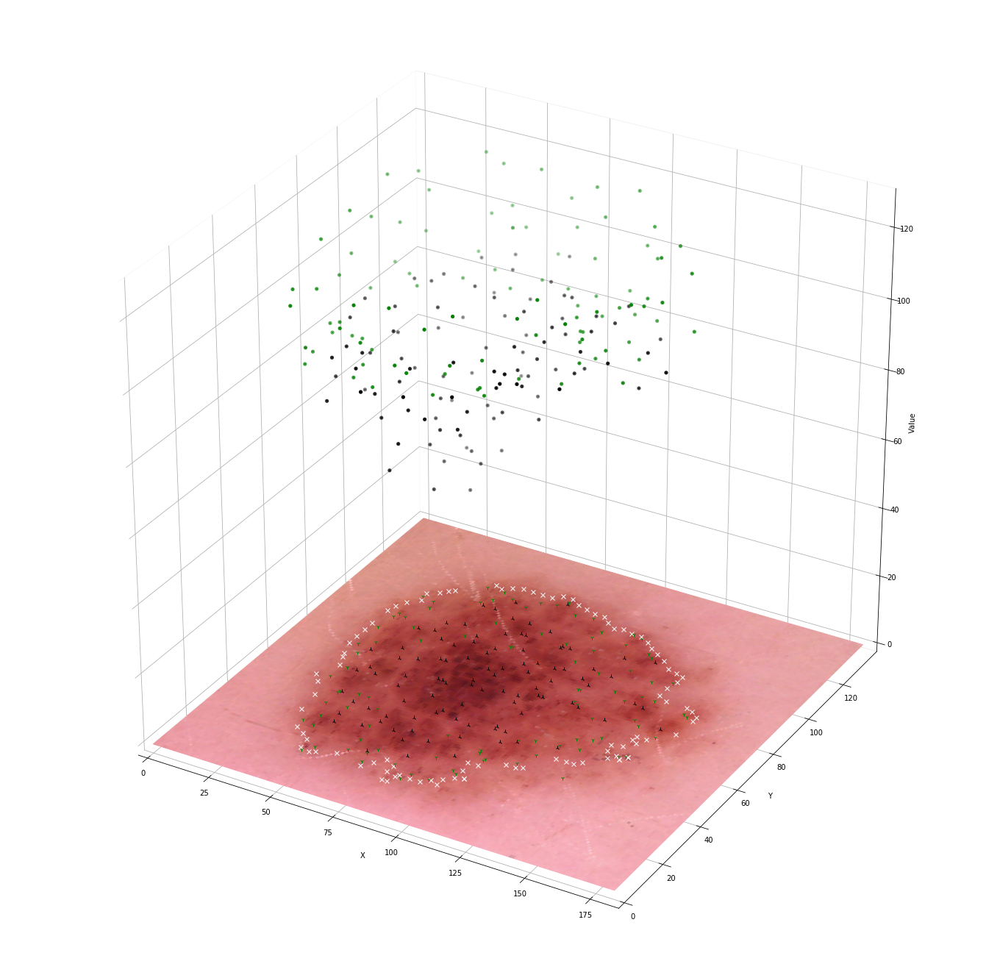

In [53]:
sampled_points = process_image("Image-Data/single_cancer.png", cluster_format='grayscale')

(122, 2)


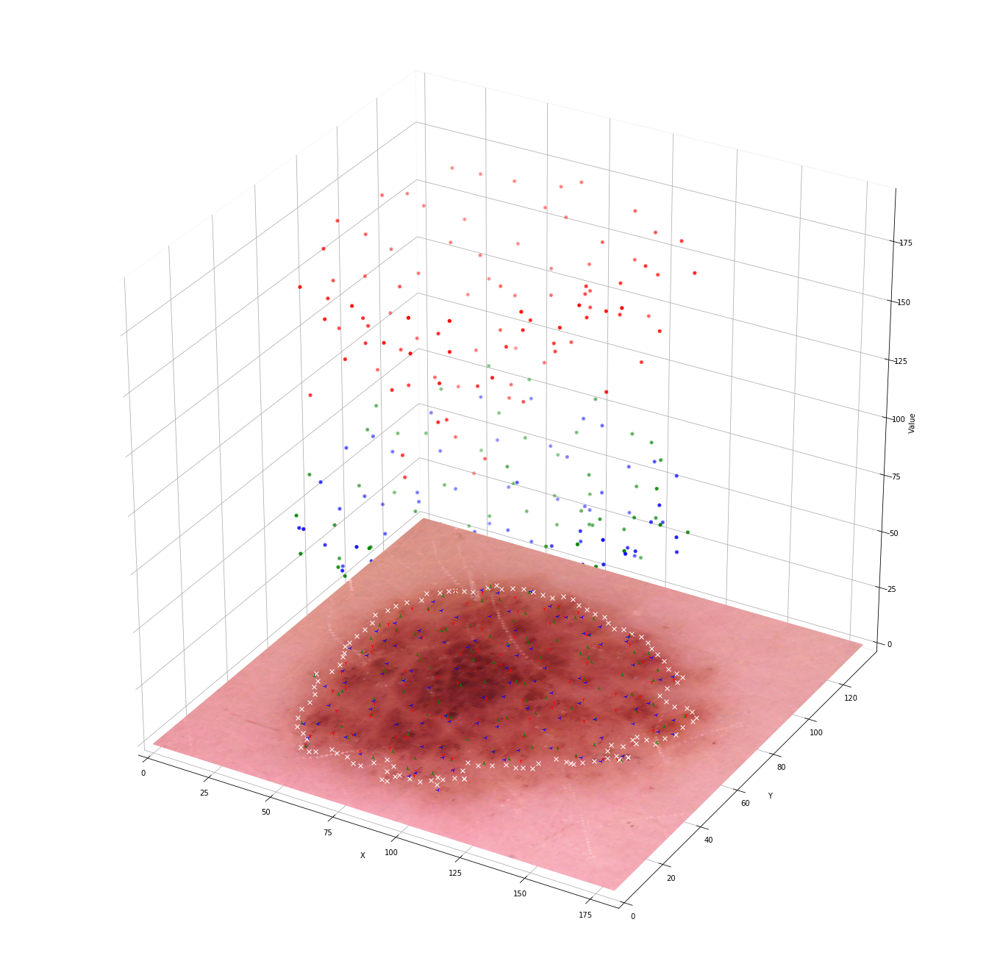

In [12]:
process_image("Image-Data/single_cancer.png", cluster_format='rgb')

(122, 2)


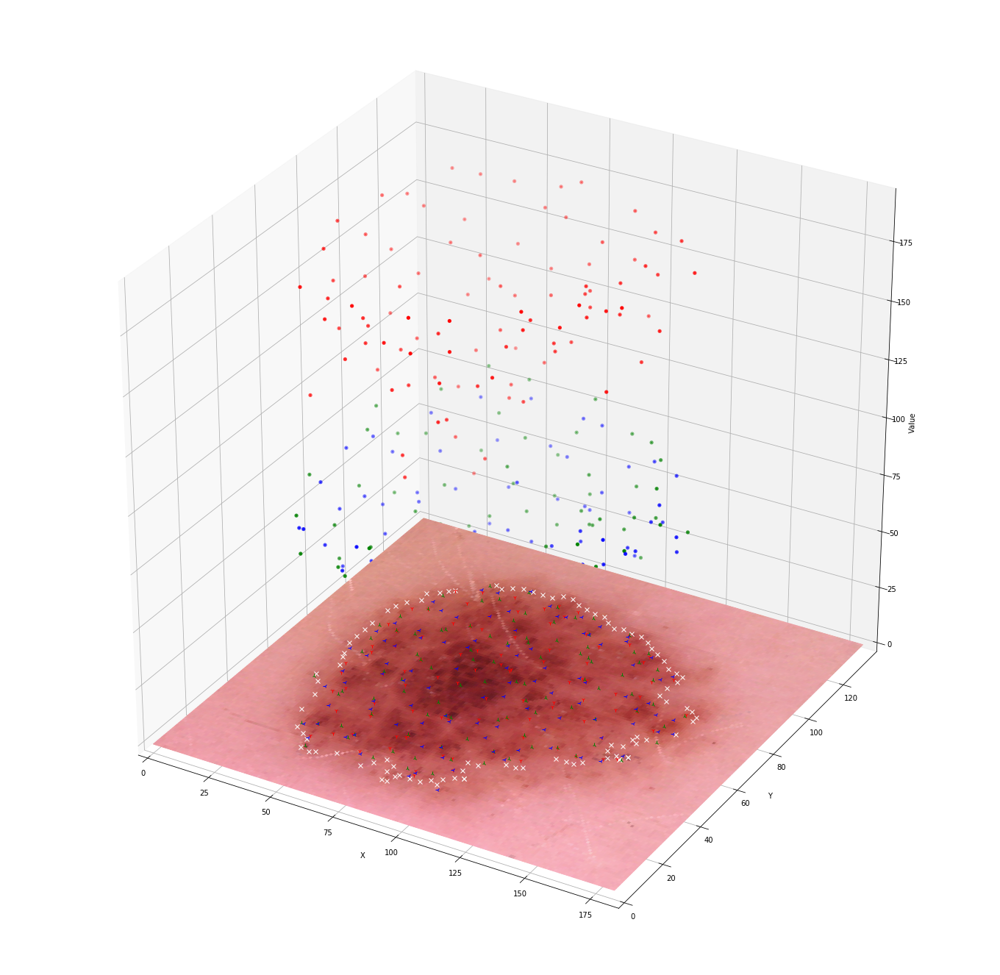

[[[23, 81],
  [151, 84],
  [130, 100],
  [41, 24],
  [144, 54],
  [37, 107],
  [137, 59],
  [23, 77],
  [122, 105],
  [92, 19],
  [134, 99],
  [88, 19],
  [154, 82],
  [26, 62],
  [37, 26],
  [142, 64],
  [27, 48],
  [82, 15],
  [72, 21],
  [146, 56],
  [100, 111],
  [33, 104],
  [51, 114],
  [73, 119],
  [30, 98],
  [136, 87],
  [95, 21],
  [31, 42],
  [93, 115],
  [24, 92],
  [32, 34],
  [49, 17],
  [83, 18],
  [118, 38],
  [144, 63],
  [98, 23],
  [118, 107],
  [136, 91],
  [100, 33],
  [116, 37],
  [48, 115],
  [115, 109],
  [58, 20],
  [29, 102],
  [153, 72],
  [101, 25],
  [104, 26],
  [137, 98],
  [144, 54],
  [26, 95],
  [44, 22],
  [132, 46],
  [141, 60],
  [103, 112],
  [98, 20],
  [28, 58],
  [45, 18],
  [96, 113],
  [54, 116],
  [66, 117],
  [23, 89],
  [129, 46],
  [58, 117],
  [101, 29],
  [104, 26],
  [112, 37],
  [85, 116],
  [23, 69],
  [142, 55],
  [107, 111],
  [146, 56],
  [126, 103],
  [80, 15],
  [148, 85],
  [70, 117],
  [79, 22],
  [77, 119],
  [140, 85],
  [104

In [68]:
process_image("Image-Data/single_cancer.png", cluster_format='rgb')

(122, 2)


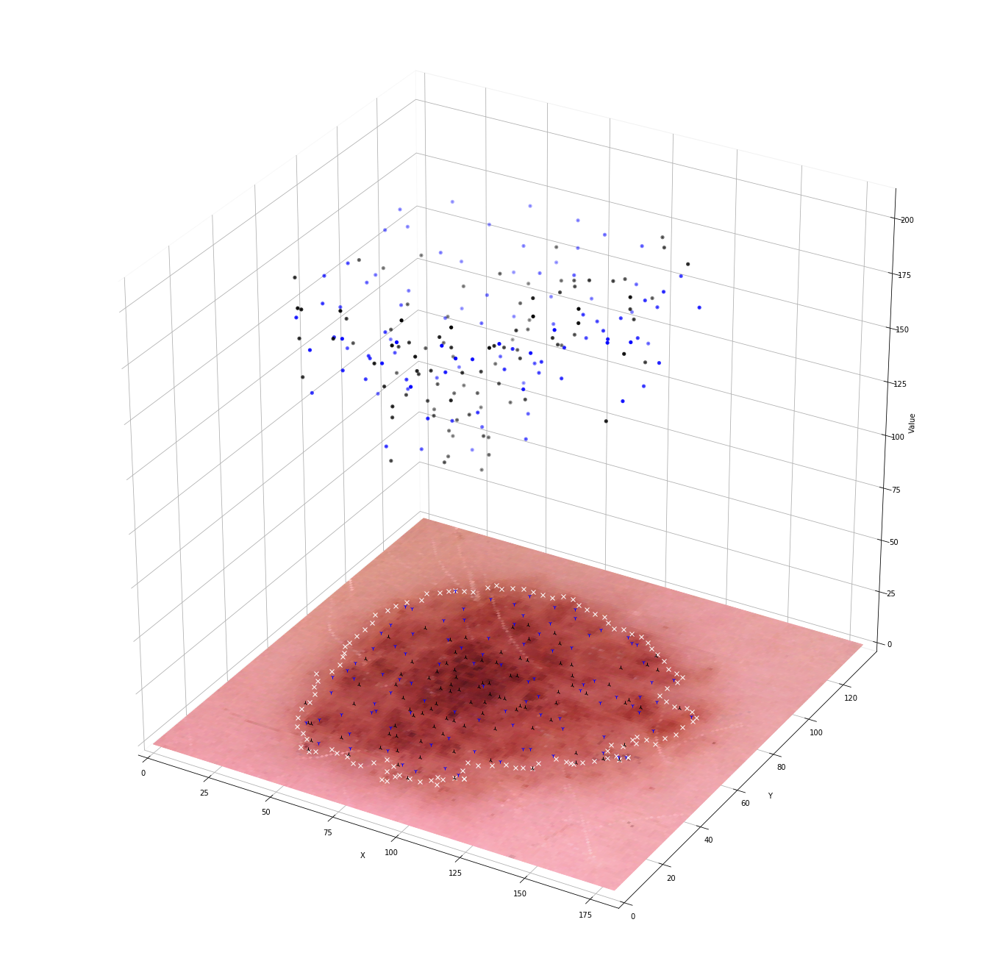

In [13]:
process_image("Image-Data/single_cancer.png", cluster_format='hsv')

(122, 2)


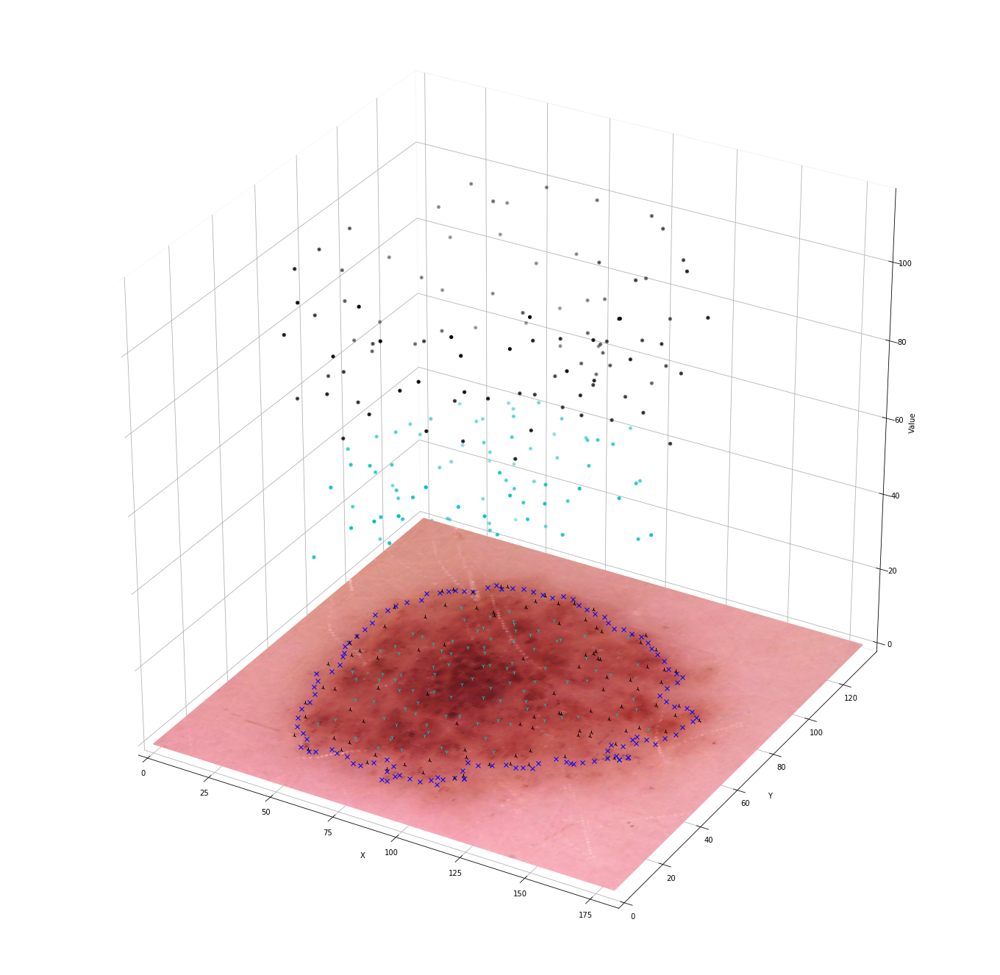

In [11]:
process_image("Image-Data/single_cancer.png")

(139, 2)


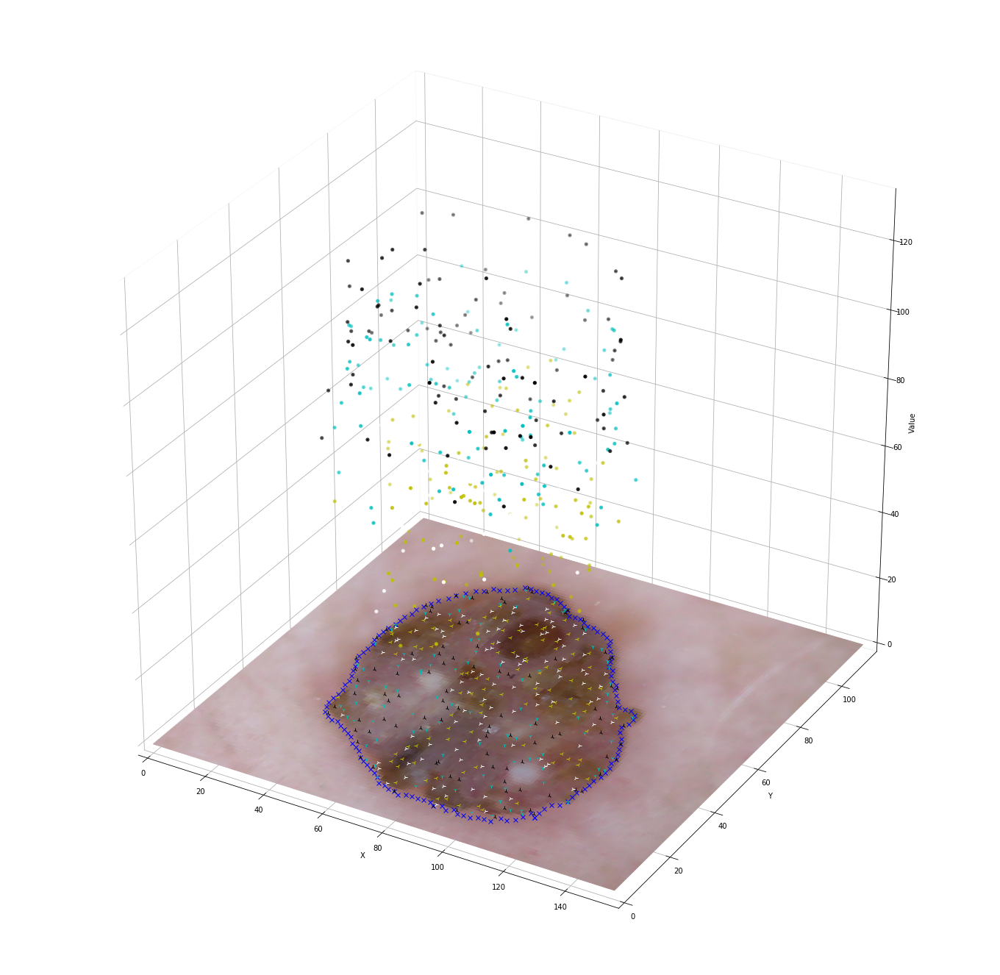

In [18]:
process_image("Image-Data/other_cancer.png")

(139, 2)


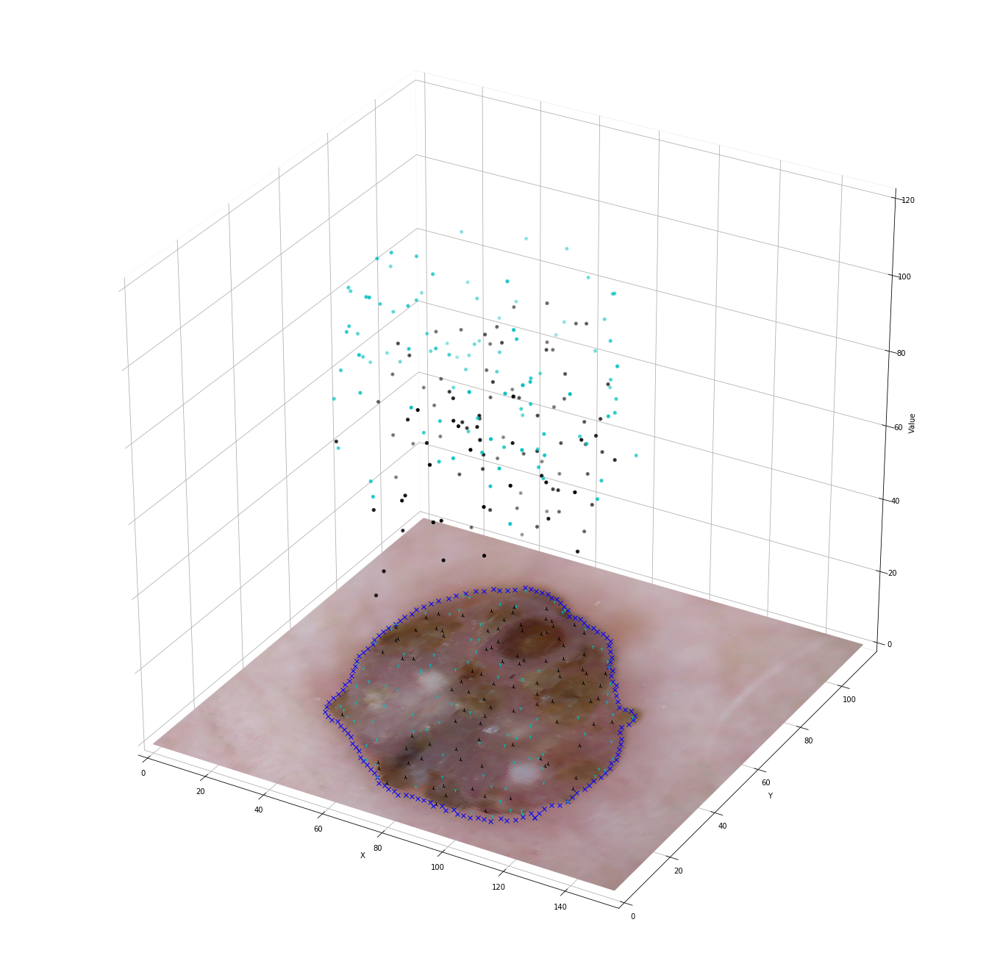

In [157]:
process_image("Image-Data/other_cancer.png")

(103, 2)


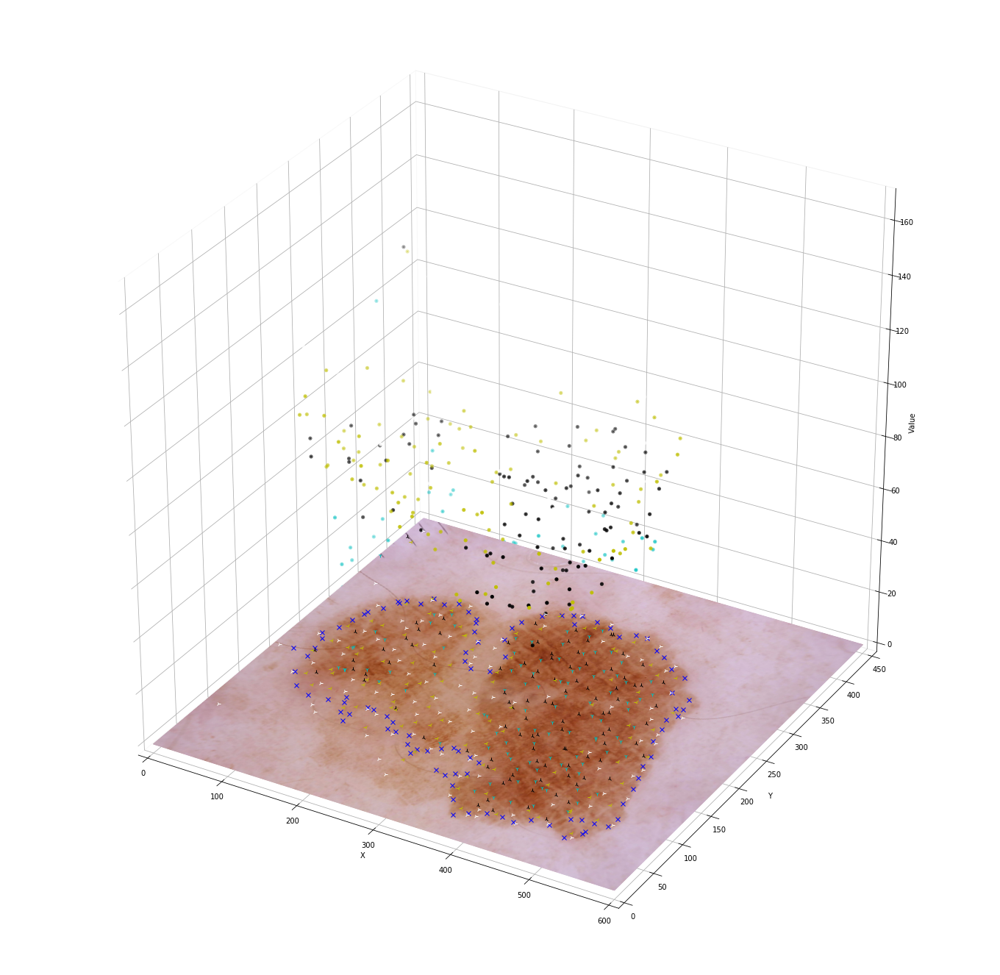

In [24]:
process_image("ham10000_images_part_2/ISIC_0029394.jpg")

(109, 2)


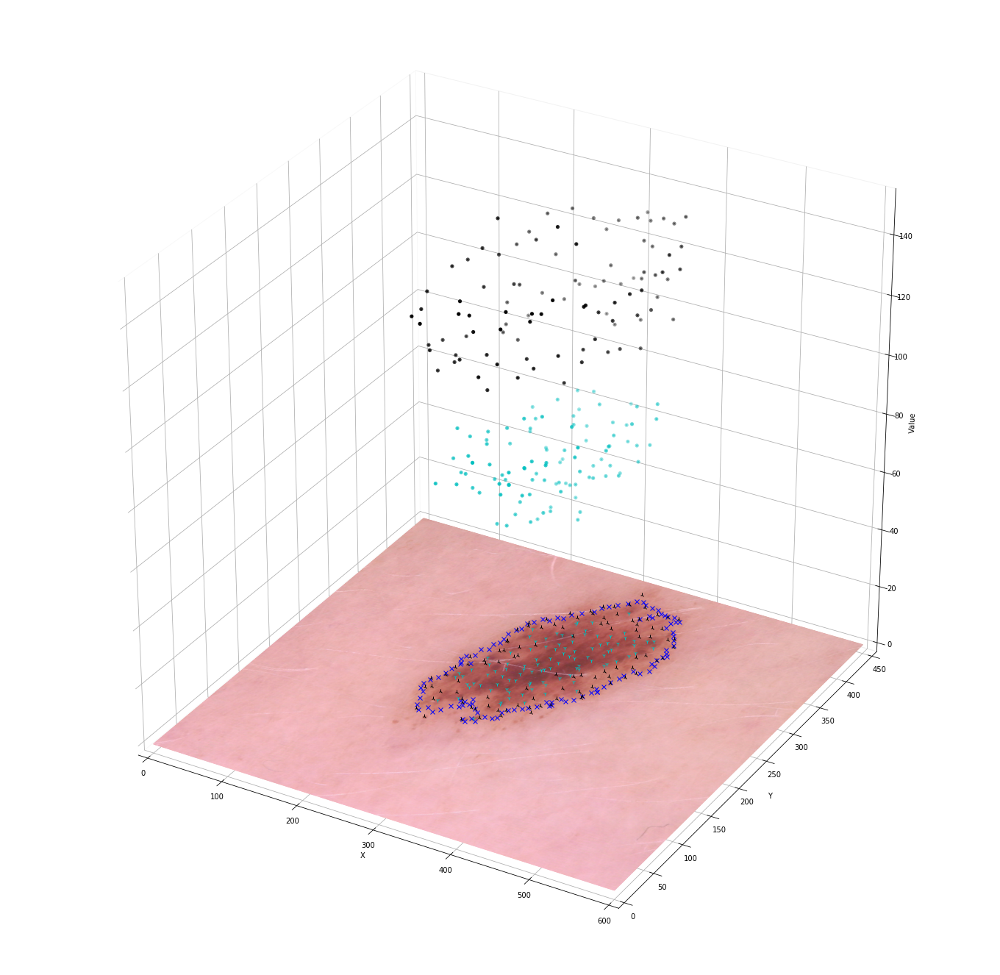

In [161]:
process_image("ham10000_images_part_2/ISIC_0029317.jpg")

(120, 2)


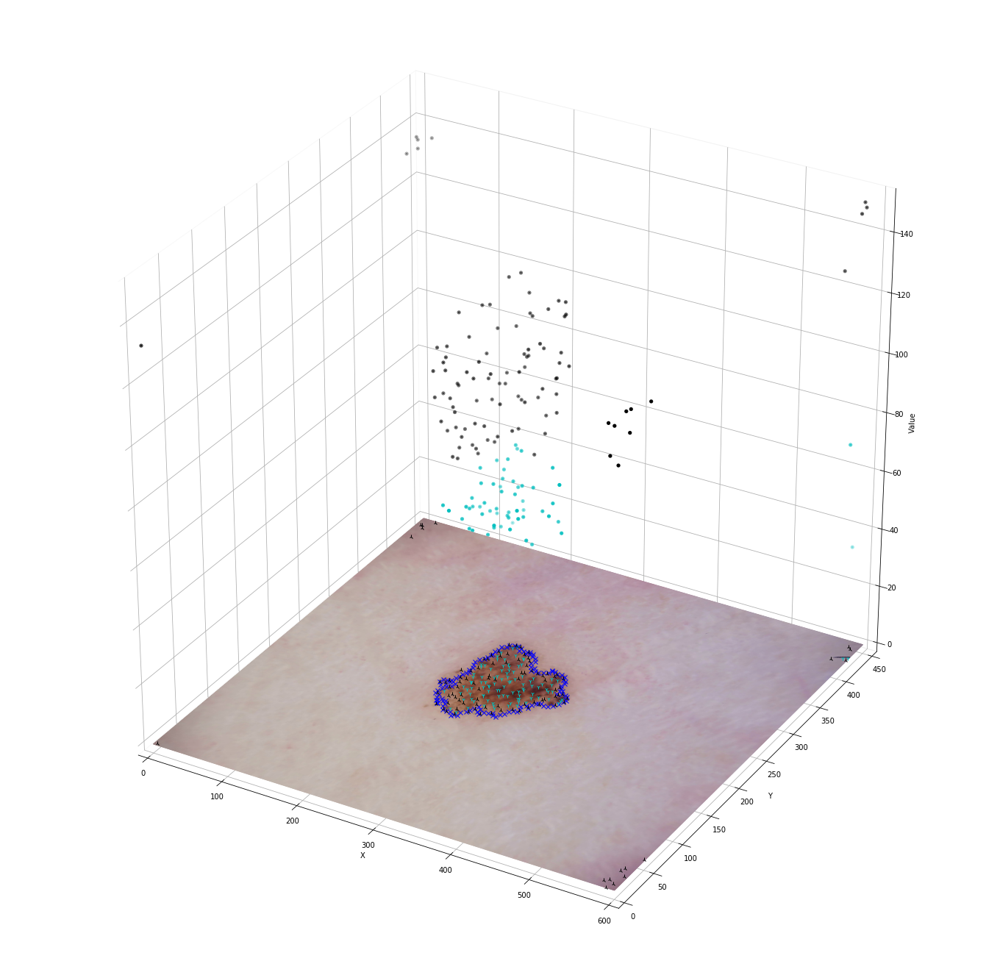

In [164]:
process_image("ham10000_images_part_2/ISIC_0029332.jpg")

(104, 2)


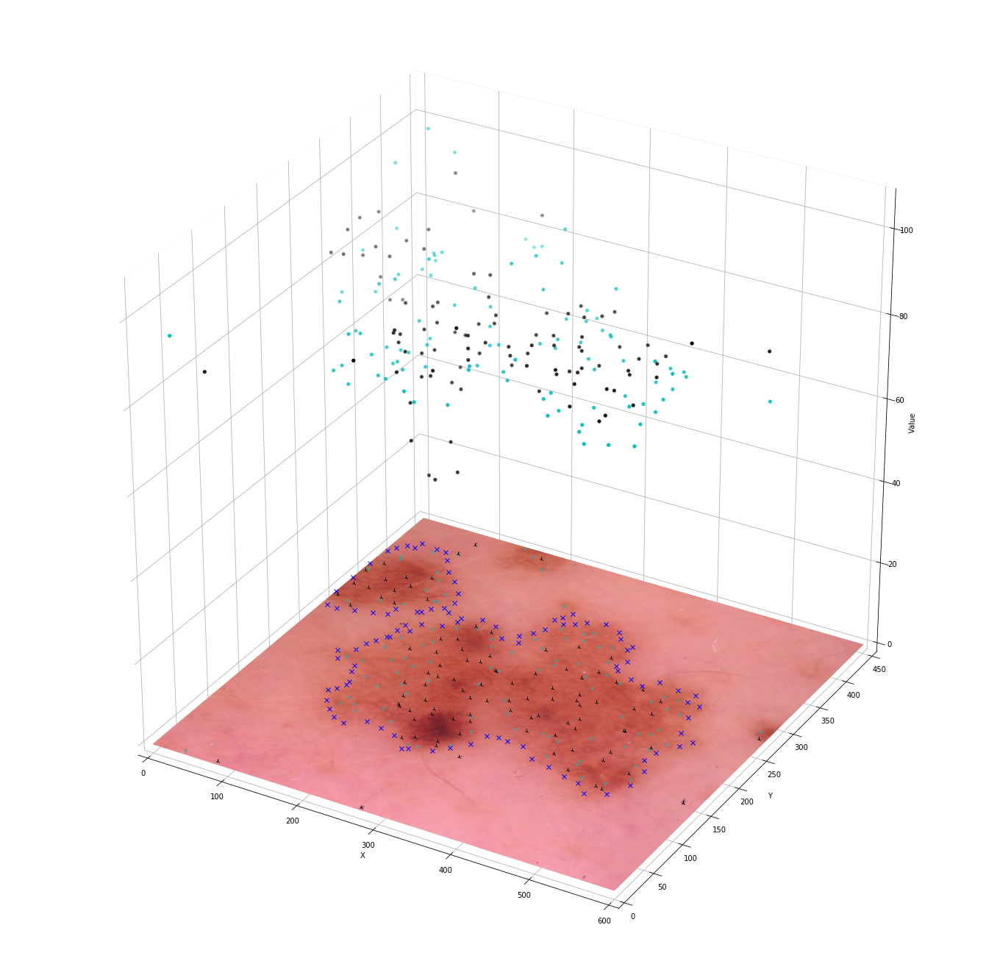

In [167]:
process_image("ham10000_images_part_2/ISIC_0029333.jpg")

(104, 2)


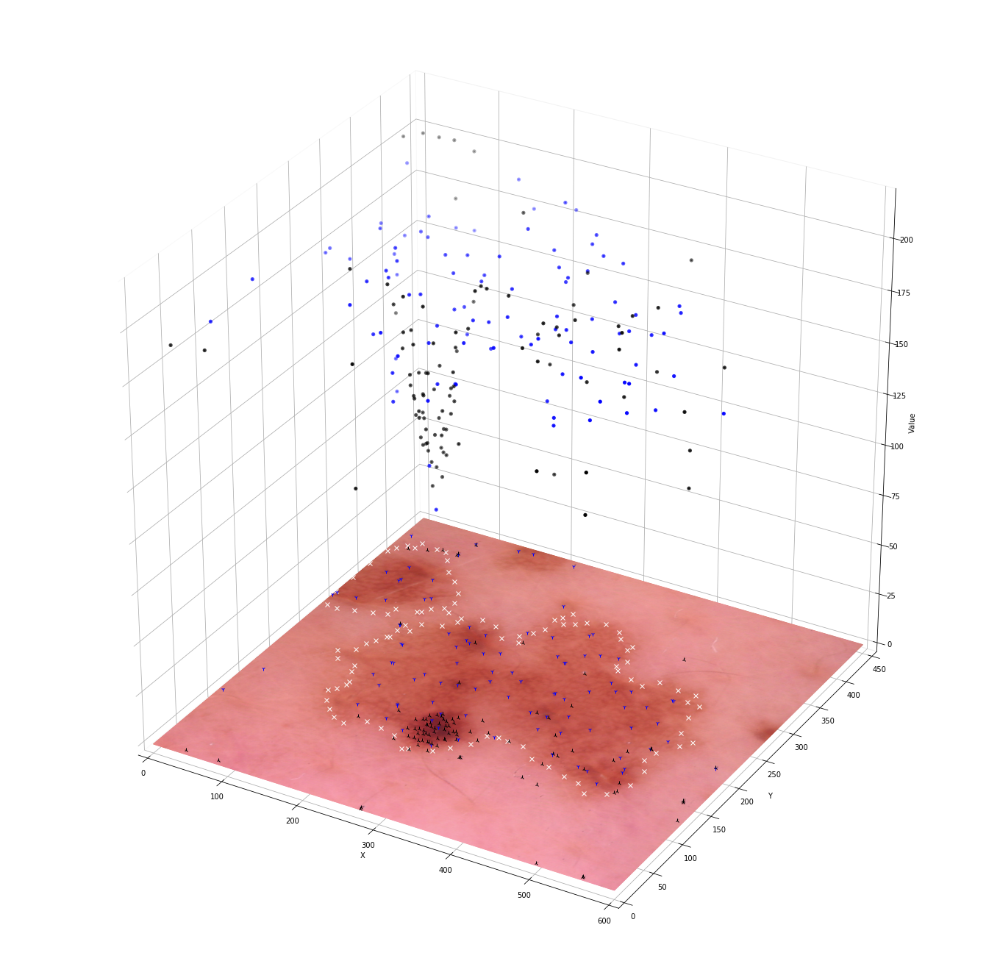

In [42]:
process_image("ham10000_images_part_2/ISIC_0029333.jpg", cluster_format='hsv')

(104, 2)


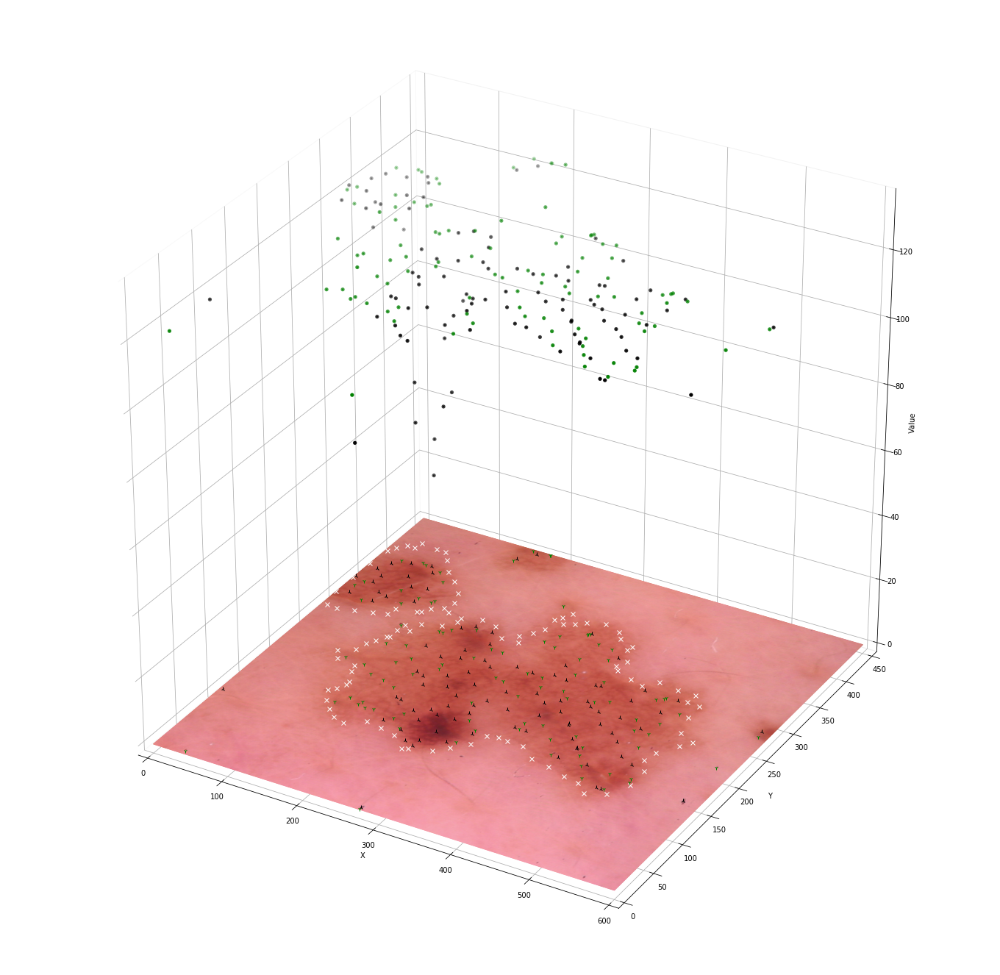

In [43]:
process_image("ham10000_images_part_2/ISIC_0029333.jpg", cluster_format='grayscale')

(101, 2)


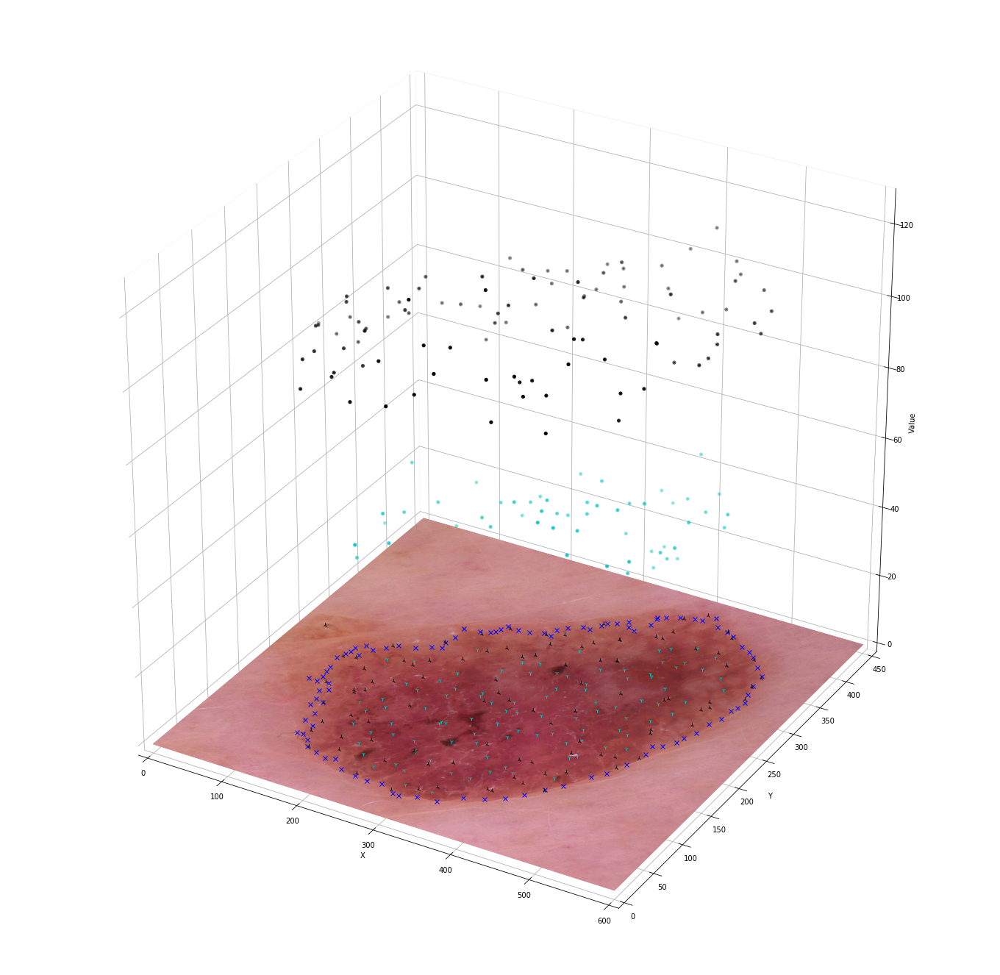

In [168]:
process_image("ham10000_images_part_2/ISIC_0029345.jpg")

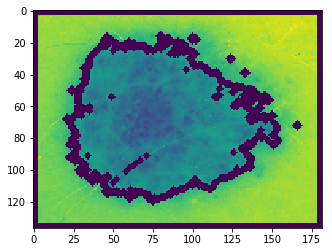

In [166]:
# Import myimage
myimg = cv2.imread("Image-Data/single_cancer.png")
myimg_gray = cv2.cvtColor(myimg, cv2.COLOR_BGR2GRAY)
myret, mythresh = cv2.threshold(myimg_gray, 127, 255, 0)
# Get boundary contour
#imgray = cv2.cvtColor(thresh2, cv2.COLOR_RGB2GRAY)
#ret, thresh = cv2.threshold(imgray, 127, 255, 0)
# To generate more points in contours
#contours, hierarchy = cv2.findContours(thresh2, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
# To generate fewer points in contours (doesn't work well for these images)
contours, hierarchy = cv2.findContours(mythresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
#print(contours)
# Get contour with maximum length
#max_contour = max(contours,key=len)
#im3 = cv2.drawContours(myimg_gray, max_contour, -1, 0, 3)
im3 = cv2.drawContours(myimg_gray, contours, -1, 0, 3)
plt.imshow(im3)
plt.show()

In [59]:
max_contour.shape

(486, 1, 2)

In [60]:
# This converts max contour into array of ordered pairs that can be sampled from
flat_cntrs = max_contour.squeeze()
flat_cntrs

array([[ 80,  15],
       [ 80,  16],
       [ 81,  17],
       [ 80,  18],
       [ 79,  19],
       [ 78,  20],
       [ 79,  20],
       [ 80,  21],
       [ 79,  22],
       [ 78,  22],
       [ 77,  23],
       [ 76,  24],
       [ 75,  24],
       [ 74,  23],
       [ 74,  22],
       [ 73,  21],
       [ 72,  21],
       [ 71,  21],
       [ 70,  20],
       [ 70,  19],
       [ 69,  18],
       [ 68,  18],
       [ 67,  18],
       [ 66,  17],
       [ 66,  18],
       [ 65,  19],
       [ 64,  20],
       [ 63,  20],
       [ 62,  20],
       [ 61,  20],
       [ 60,  20],
       [ 59,  21],
       [ 58,  20],
       [ 57,  20],
       [ 56,  19],
       [ 56,  20],
       [ 55,  21],
       [ 54,  21],
       [ 53,  20],
       [ 52,  19],
       [ 51,  18],
       [ 51,  17],
       [ 51,  16],
       [ 50,  17],
       [ 49,  17],
       [ 48,  18],
       [ 47,  17],
       [ 46,  17],
       [ 45,  18],
       [ 44,  19],
       [ 45,  20],
       [ 45,  21],
       [ 44,

In [62]:
# Sample from the contour points to get simplified contour
n_points = 100
n_skip = int(float(flat_cntrs.shape[0])/n_points)
sampled_cntrs = flat_cntrs[::n_skip]
sampled_cntrs[:,0]

array([ 80,  79,  79,  75,  72,  69,  66,  62,  58,  55,  51,  49,  45,
        44,  41,  37,  34,  32,  32,  31,  28,  27,  24,  28,  28,  26,
        25,  23,  23,  23,  23,  23,  21,  23,  24,  26,  30,  29,  33,
        35,  37,  40,  43,  46,  48,  51,  54,  58,  62,  66,  70,  73,
        77,  81,  85,  89,  93,  96, 100, 103, 107, 111, 115, 118, 122,
       126, 130, 134, 137, 137, 136, 136, 140, 144, 148, 151, 154, 154,
       153, 153, 151, 150, 146, 142, 142, 144, 141, 137, 138, 142, 146,
       146, 144, 144, 140, 137, 134, 132, 131, 129, 125, 121, 121, 118,
       116, 112, 108, 104, 100, 101, 104, 104, 101,  98,  98,  96,  95,
        92,  88,  84,  83,  82], dtype=int32)

In [23]:
im3 = cv2.drawContours(myimg_gray, sampled_cntrs, -1, 0, 3)
plt.imshow(im3)
plt.show()

NameError: name 'sampled_cntrs' is not defined